In [15]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn import tree
from sklearn import svm
from sklearn import ensemble
from sklearn import neighbors
from sklearn import linear_model
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.pipeline import Pipeline
#!pip install -U imbalanced-learn
#import imblearn
#from imblearn.over_sampling import SMOTE

In [17]:
%matplotlib inline 

from IPython.display import Image
import pandas as pd
pd.options.display.max_columns = None
import matplotlib as mlp
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import sklearn
import seaborn as sb
import json
import missingno as msno

In [18]:
# make sure you assign the dataframe to the variable "df"
df = pd.read_csv('C:/Users/ShatheepR/Desktop/ASN_WinLoss_2018_19.txt', sep='\t', lineterminator='\r', header=0,error_bad_lines=False, encoding='latin-1')
print (df.shape)
df.head()

(10648, 29)


,Opp No,Detail Key,Target,YR,QTR,Geo Level 3,UT Brand Level 1,UT Brand Level 2,Dominant Brand,Multi Brand,Age Group,SELL_CYCLE,Opp Source L3,Owning Org,Client Segment L2,Dtl Deal Size,GB_GC_CN,GB_GC_CN_NAME,SEQUENCE,FIRTS,ROLL_OVER,QY_ROLL_COUNT,REVENUE,NON_SYS_CLIENT_CATG,SYS_CLIENT_CATG,SYS_CLIENT_GROWTH RATE,SEQUENCE_GRP,SELL_CYCLE_CATG,ROLL_OVER_GRP
0,\nBP1-UP-7SU1GU8,703e0dc3-c56f-b86b-9979-5d5a00ef4ff3,0.0,2019.0,Q4,Brunei,Cognitive Systems,AIX / IBM i Market,Power,N,B 90 - 180 DAYS,127.0,Business Partner,Business Partners,TOP,D 100K TO 250K,GCT4H44W,BANK ISLAM BRUNEI DARUSSALAM BERHAD,2.0,Validated,0.0,1.0,0.15,Existing,Existing,Existing-Declining revenue,01 SS CHANGE,<180 DAYS,NO ROLL OVER
1,\n8V-DFW8QQI,de8ed2e6-758a-9d7d-8611-5c9b3b758d83,0.0,2019.0,Q4,Brunei,Cognitive Systems,Cognitive Infrastructure Market,Power,N,D 270+ DAYS,246.0,Brand Specialist - Hardware,Field Sales,Enterprise Core,D 100K TO 250K,GB001410,ROYAL DUTCH SHELL,2.0,Validated,0.0,1.0,0.20,Existing,Existing,Existing-YTY Systems Revenue (0-7%),01 SS CHANGE,<360 DAYS,NO ROLL OVER
2,\nBP1-6M-W2099YP,8ba00a00-48f6-a0e7-b6ed-5cfe4d161ed6,0.0,2019.0,Q4,Brunei,Storage,Modern Data Protection Market,Storage,N,C 180 - 270 DAYS,198.0,Business Partner,Business Partners,TOP,A LT 25K,GCT4H44W,BANK ISLAM BRUNEI DARUSSALAM BERHAD,2.0,Validated,0.0,1.0,0.02,Existing,Existing,Existing-Declining revenue,01 SS CHANGE,<360 DAYS,NO ROLL OVER
3,\nBP1-US-3ZLH8RI,1ac09326-c80d-7613-93d0-5d804d7ff64a,0.0,2019.0,Q4,Brunei,Storage,Modern Data Protection Market,Storage,N,B 90 - 180 DAYS,64.0,Business Partner,Business Partners,Enterprise Core,B 25K TO 50K,GB001410,ROYAL DUTCH SHELL,2.0,Validated,0.0,1.0,0.04,Existing,Existing,Existing-YTY Systems Revenue (0-7%),01 SS CHANGE,<090 DAYS,NO ROLL OVER
4,\nBP1-0V-FVH3GWD,51175687-b8d3-1284-1aae-5dd7ba5b5dfe,1.0,2019.0,Q4,Brunei,Storage,Modern Data Protection Market,Storage,N,A 0 - 90 DAYS,6.0,Business Partner,Business Partners,Enterprise Core,C 50K TO 100K,GB001410,ROYAL DUTCH SHELL,2.0,Validated,0.0,1.0,0.07,Existing,Existing,Existing-YTY Systems Revenue (0-7%),01 SS CHANGE,<010 DAYS,NO ROLL OVER


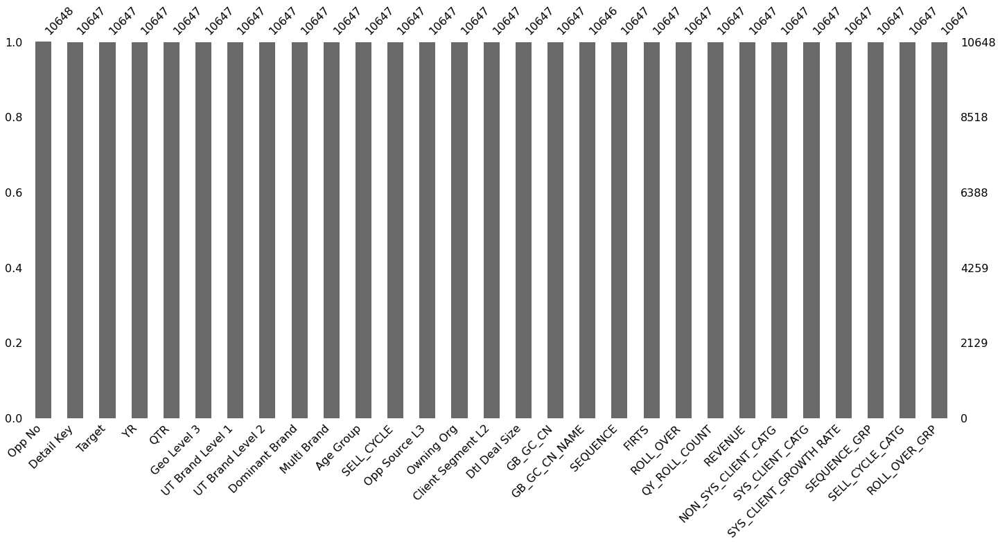

In [19]:
msno.bar(df)

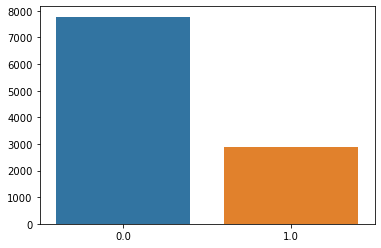

In [21]:
y = df["Target"].value_counts()
sb.barplot(y.index, y.values)

In [6]:
y_True = df["Target"][df["Target"] == 1]
print ("Win Percentage = "+ str( (y_True.shape[0] / df["Target"].shape[0]) * 100 ))

Win Percentage = 26.94402704733283


In [7]:
df.describe()

,Target,YR,SELL_CYCLE,SEQUENCE,ROLL_OVER,QY_ROLL_COUNT,REVENUE
count,10647.000000,10647.000000,10647.000000,10647.000000,10647.000000,10647.000000,10647.000000
mean,0.269466,2018.486898,206.237438,2.748662,0.829342,2.015216,0.332995
std,0.443703,0.499852,164.980579,1.236819,1.234672,1.411871,18.654230
min,0.000000,2018.000000,0.000000,1.000000,0.000000,1.000000,0.000001
25%,0.000000,2018.000000,90.000000,2.000000,0.000000,1.000000,0.019799
50%,0.000000,2018.000000,171.000000,2.000000,0.000000,2.000000,0.050000
75%,1.000000,2019.000000,291.000000,3.000000,1.000000,3.000000,0.100000
max,1.000000,2019.000000,1870.000000,18.000000,16.000000,19.000000,1923.585097


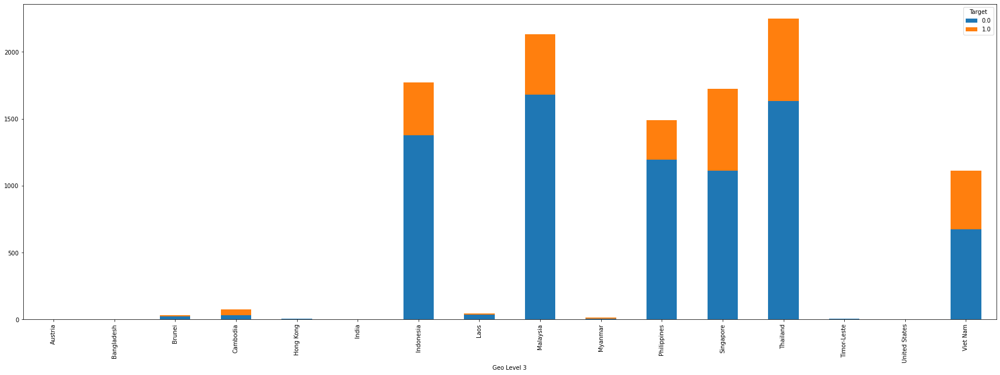

In [8]:
df.groupby(["Geo Level 3", "Target"]).size().unstack().plot(kind='bar', stacked=True, figsize=(30,10))

In [9]:
def create_bins(lower_bound, width, quantity):
    """ create_bins returns an equal-width (distance) partitioning. 
        It returns an ascending list of tuples, representing the intervals.
        A tuple bins[i], i.e. (bins[i][0], bins[i][1])  with i > 0 
        and i < quantity, satisfies the following conditions:
            (1) bins[i][0] + width == bins[i][1]
            (2) bins[i-1][0] + width == bins[i][0] and
                bins[i-1][1] + width == bins[i][1]
    """
    bins = []
    for low in range(lower_bound, 
                     lower_bound + quantity*width + 1, width):
        bins.append((low, low+width))
    return bins
from collections import Counter
bins = create_bins(lower_bound=0,
                   width=30,
                   quantity=200)
import pandas as pd
bins2 = pd.IntervalIndex.from_tuples(bins)
categorical_object = pd.cut(df['REVENUE'], bins2)
print(categorical_object)

0             (0, 30]
1             (0, 30]
2             (0, 30]
3             (0, 30]
4             (0, 30]
             ...     
10643         (0, 30]
10644         (0, 30]
10645         (0, 30]
10646         (0, 30]
10647    (3000, 3030]
Name: REVENUE, Length: 10648, dtype: category
Categories (201, interval[int64]): [(0, 30] < (30, 60] < (60, 90] < (90, 120] ... (5910, 5940] < (5940, 5970] < (5970, 6000] < (6000, 6030]]


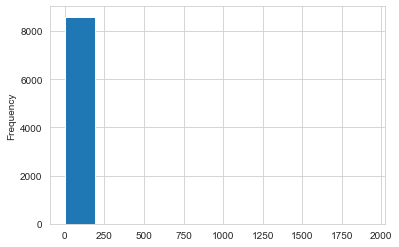

In [10]:
import pandas as pd
import numpy as np
import seaborn as sns

sns.set_style('whitegrid')

df1 = df.groupby(['Opp No'])['REVENUE'].sum().reset_index()

df1['REVENUE'].plot(kind='hist')

In [11]:
# Discreet value integer encoder
label_encoder = preprocessing.LabelEncoder()
# State, international plans and voice mail plan are strings and we want discreet integer values
#df['DETAIL_AGE_DAYS'] = label_encoder.fit_transform(df['DETAIL_AGE_DAYS'])
df['SELL_CYCLE'] = label_encoder.fit_transform(df['SELL_CYCLE'])
#df['SEQUENCE'] = label_encoder.fit_transform(df['SEQUENCE'])
#df['ROLL_OVER'] = label_encoder.fit_transform(df['ROLL_OVER'])
df['QY_ROLL_COUNT'] = label_encoder.fit_transform(df['QY_ROLL_COUNT'])
#df['REVENUE'] = label_encoder.fit_transform(df['REVENUE'])
print (df.dtypes)

Opp No                     object
Detail Key                 object
Target                    float64
YR                        float64
QTR                        object
Geo Level 3                object
UT Brand Level 1           object
UT Brand Level 2           object
Dominant Brand             object
Multi Brand                object
Age Group                  object
SELL_CYCLE                  int64
Opp Source L3              object
Owning Org                 object
Client Segment L2          object
Dtl Deal Size              object
GB_GC_CN                   object
GB_GC_CN_NAME              object
SEQUENCE                  float64
FIRTS                      object
ROLL_OVER                 float64
QY_ROLL_COUNT               int64
REVENUE                   float64
NON_SYS_CLIENT_CATG        object
SYS_CLIENT_CATG            object
SYS_CLIENT_GROWTH RATE     object
SEQUENCE_GRP               object
SELL_CYCLE_CATG            object
ROLL_OVER_GRP              object
dtype: object


In [12]:
X= df.drop(["Target","Opp No", "Detail Key","GB_GC_CN", "GB_GC_CN_NAME", "QY_ROLL_COUNT", "YR", "ROLL_OVER", "SELL_CYCLE", "SEQUENCE","Age Group", "REVENUE"],axis=1)
X= pd.get_dummies(X)
X1= pd.get_dummies(X)
y= df['Target'].values.astype(np.int)
y.size
X = X.values.astype(np.float)
print(X)
X.shape
#X.replace([np.inf, -np.inf], np.nan, inplace=True)

[[0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]]


(10648, 154)

In [13]:
X1.to_excel(r'C:/Users/ShatheepR/Desktop/Export.xlsx', index = False)

In [14]:
scaler = preprocessing.StandardScaler()
X = scaler.fit_transform(X)
X

array([[-0.43587451, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327,  0.89895318],
       [-0.43587451, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327,  0.89895318],
       [-0.43587451, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327,  0.89895318],
       ...,
       [ 2.29423831, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327, -1.11240498],
       [ 2.29423831, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327,  0.89895318],
       [-0.43587451, -0.6062861 , -0.63692744, ..., -0.31062601,
        -0.09284327, -1.11240498]])

In [44]:
# create classifiers
from sklearn.ensemble import GradientBoostingClassifier
gradient_boost = GradientBoostingClassifier()
print(type(gradient_boost).__name__)
from sklearn.svm import SVC
svc_model = SVC(gamma='auto')
print(type(svc_model).__name__)
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators=10)
print(type(random_forest).__name__)
from sklearn.neighbors import KNeighborsClassifier
k_neighbors = KNeighborsClassifier()
print(type(k_neighbors).__name__)
from sklearn.linear_model import LogisticRegression
logistic_regression = LogisticRegression(solver='lbfgs')
print(type(logistic_regression).__name__)

GradientBoostingClassifier
SVC
RandomForestClassifier
KNeighborsClassifier
LogisticRegression


In [60]:
def stratified_cv(X_train, y_train, X_test, clf_class, shuffle=True, n_folds=10):
#-------------------
#    stratified_k_fold = model_selection.StratifiedKFold(n_splits=n_folds, shuffle=shuffle)
#    y_pred = y.copy()
#    # ii -> train
#    # jj -> test indices
#    for ii, jj in stratified_k_fold.split(X, y): 
#        X_train, X_test = X[ii], X[jj]
#        y_train = y[ii]
#        clf = clf_class
#        clf.fit(X_train,y_train)
#        y_pred[jj] = clf.predict(X_test)
#-------------------
#    y_pred = y.copy()
    clf = clf_class
    model_name = type(clf).__name__
    if model_name == 'SVC':  
        param_grid = {
            'C': [0.1, 1, 10, 100, 1000], 
            'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
            'kernel': ['rbf']
            }
    elif model_name == 'GradientBoostingClassifier':
        param_grid = {
            "loss":["deviance"],
            "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
            "min_samples_split": np.linspace(0.1, 0.5, 12),
            "min_samples_leaf": np.linspace(0.1, 0.5, 12),
            "max_depth":[3,5,8],
            "max_features":["log2","sqrt"],
            "criterion": ["friedman_mse",  "mae"],
            "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
            "n_estimators":[10]
            }
    elif model_name == 'RandomForestClassifier':  
        param_grid = {
            "n_estimators":[100, 300, 500, 800, 1200],
            "max_depth": [5, 8, 15, 25, 30],
            "min_samples_split":[2, 5, 10, 15, 100],
            "min_samples_leaf":[1, 2, 5, 10]
            }
    elif model_name == 'KNeighborsClassifier':  
        param_grid = {
            "n_neighbors":[5,6,7,8,9,10],
            "leaf_size":[1,2,3,5],
            "weights":['uniform', 'distance'],
            "algorithm":['auto', 'ball_tree','kd_tree','brute'],
            "n_jobs":[-1]
            }
    elif model_name == 'LogisticRegression':  
        param_grid = {
            "loss":["deviance"],
            "learning_rate": [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2],
            "min_samples_split": np.linspace(0.1, 0.5, 12),
            "min_samples_leaf": np.linspace(0.1, 0.5, 12),
            "max_depth":[3,5,8],
            "max_features":["log2","sqrt"],
            "criterion": ["friedman_mse",  "mae"],
            "subsample":[0.5, 0.618, 0.8, 0.85, 0.9, 0.95, 1.0],
            "n_estimators":[10]
            }
    np.random.seed(300)
    mod = model_selection.GridSearchCV(clf,param_grid, refit = True, verbose = 3)
    grid_result = mod.fit(X_train,y_train)
    y_pred = grid_result.predict(X_test)
    return y_pred

In [61]:
import time
start_time = time.time()
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=200)
print('Gradient Boosting Classifier:  {:.2f}'.format(metrics.accuracy_score(y_test, stratified_cv(X_train, y_train, X_test, gradient_boost))))
print('Support vector machine(SVM):   {:.2f}'.format(metrics.accuracy_score(y_test, stratified_cv(X_train, y_train, X_test, svc_model))))
print('Random Forest Classifier:      {:.2f}'.format(metrics.accuracy_score(y_test, stratified_cv(X_train, y_train, X_test, random_forest))))
print('K Nearest Neighbor Classifier: {:.2f}'.format(metrics.accuracy_score(y_test, stratified_cv(X_train, y_train, X_test, k_neighbors))))
print('Logistic Regression:           {:.2f}'.format(metrics.accuracy_score(y_test, stratified_cv(X_train, y_train, X_test, logistic_regression))))
print("Execution time: " + str((time.time() - start_time)) + ' ms')

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


Fitting 3 folds for each of 84672 candidates, totalling 254016 fits
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5 


C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[C

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.136363636363636

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, scor

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.730281690140

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_le

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, mi

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV]

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.5, scor

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criteri

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, sub

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, scor

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.730281690140

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.35

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_lea

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_est

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criteri

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] crite

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] cri

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sa

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimato

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] cr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] c

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] crite

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] cri

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.7s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] crite

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] cr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   5.8s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_est

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criter

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimator

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] crit

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_l

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_e

[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samp

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criteri

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_es

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.318181818181818

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_e

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_

[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.01, loss=deviance, max_depth=8, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] cri

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.136363636363

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1727272727

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2454545454545454

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2818181818181818

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3181818181818182

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.4272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.4636363636363637

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5,

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_est

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_e

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.463636363636363

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV]

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV]

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.136363636363636

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.172727272727272

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.245454545454545

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.318181818181818

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.427272727272727

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV]

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_e

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_es

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] c

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.172727272727272

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.4272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.463636363636

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=3, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.136363636363

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.172727272727

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2454545454

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.281818181818

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3181818181818182

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.4272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.4636363636363637

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.46363636363636374, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] c

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.13636363636363638,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.17272727272727273,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.24545454545454548

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.318181818181818

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_est

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.42727272727272

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.463636363636363

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.13636363636363638

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.17272727272727273

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.24545454545454548

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.28181818181818186

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.31818181818181823

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.42727272727272736

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.46363636363636374

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.13636363636363638, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.17272727272727273, min_samples_split=0

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.4s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feat

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.24545454545454548, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.28181818181818186, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.1,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.31818181818181823, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_esti

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_sampl

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimat

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.42727272727272736, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_fea

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sq

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqr

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.46363636363636374, min_samples_split=0.5

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] c

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.13636363636363638

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.172727272727272

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.2090909090909091, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.245454545454545

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.281818181818181

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.31818181818181823

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.3545454545454546, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.390909090909091, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.42727272727272736,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.4636363636363637

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=5, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.136363636363

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.172727272727

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2090909090909091

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.245454545454

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.2818181818

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.318181818181

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.3545454545454546, n_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.390909090909091, n_estim

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.46363636363636374, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=0.5,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7302816

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.1, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_split=0.5, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.13636363636363638, min_samples_sp

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.1, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_spli

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.13636363636363638, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.17272727272727273, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.17272727272727273, min_samples_split=0.

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.1, n_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.5s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.3s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.2090909090909091, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.24545454545454548, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.24545454545454548, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.28181818181818186, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.1

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.28181818181818186, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.31818181818181823, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.31818181818181823, min_samples_split=0

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.1, n

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2,

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_feature

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.3545454545454546, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_sam

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.3545454545454546, min_samples_split=0.5, n_e

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.1, n_estima

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, m

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_s

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_sa

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_sample

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.46363636363636374, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, 

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.390909090909091, min_samples_split=0.5, n_est

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.1, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.13636363636363638, n_estimators=10, subsample=0.95 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=l

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.17272727272727273, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.85, score=0.7305389221556886, total=   0.2s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.2090909090909091, n_estimators=10, subsample=0.9 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.24545454545454548, n_estimators=10, subsample=0.85 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.28181818181818186, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.618, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.31818181818181823, n_estimators=10, subsample=0.8 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_featu

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.3545454545454546, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.5, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=0.618 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, mi

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.390909090909091, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=0.5 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2

[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7302816901408451, total=   0.0s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0, score=0.7305389221556886, total=   0.1s
[CV] criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=log2, min_samples_leaf=0.42727272727272736, min_samples_split=0.42727272727272736, n_estimators=10, subsample=1.0 
[CV]  criterion=friedman_mse, learning_rate=0.025, loss=deviance, max_depth=8, max_features=lo

KeyboardInterrupt: 

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


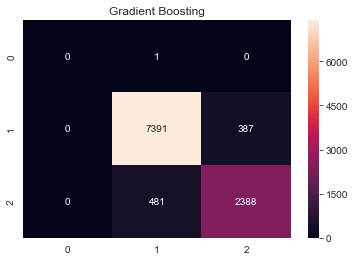

In [92]:
grad_ens_conf_matrix = metrics.confusion_matrix(y, stratified_cv(X, y, gradient_boost))
sns.heatmap(grad_ens_conf_matrix, annot=True,  fmt='');
title = 'Gradient Boosting'
plt.title(title);

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


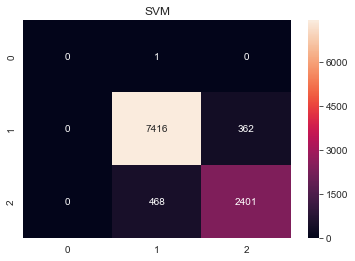

In [93]:
svm_svc_conf_matrix = metrics.confusion_matrix(y, stratified_cv(X, y, svc_model))
sns.heatmap(svm_svc_conf_matrix, annot=True,  fmt='');
title = 'SVM'
plt.title(title);

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


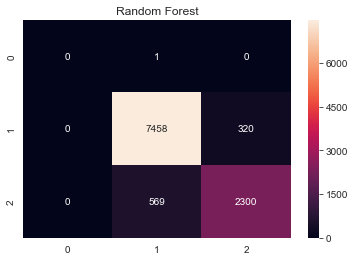

In [94]:
random_forest_conf_matrix = metrics.confusion_matrix(y, stratified_cv(X, y, random_forest))
sns.heatmap(random_forest_conf_matrix, annot=True,  fmt='');
title = 'Random Forest'
plt.title(title);

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


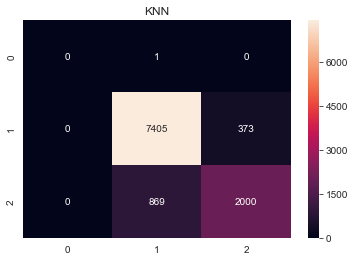

In [95]:
knn_conf_matrix = metrics.confusion_matrix(y, stratified_cv(X, y, k_neighbors))
sns.heatmap(knn_conf_matrix, annot=True,  fmt='');
title = 'KNN'
plt.title(title);

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the nu

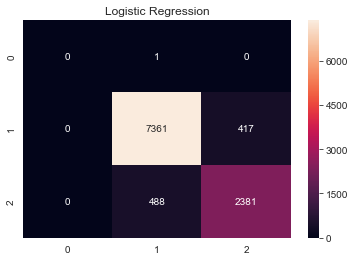

In [96]:
log_reg_conf_matrix = metrics.confusion_matrix(y, stratified_cv(X, y, logistic_regression))
sns.heatmap(log_reg_conf_matrix, annot=True,  fmt='');
title = 'Logistic Regression'
plt.title(title);

In [97]:
print('Gradient Boosting Classifier:\n {}\n'.format(metrics.classification_report(y, stratified_cv(X, y, gradient_boost))))
print('Random Forest Classifier:\n {}\n'.format(metrics.classification_report(y, stratified_cv(X, y, random_forest))))
print('Logistic Regression Classifier:\n {}\n'.format(metrics.classification_report(y, stratified_cv(X, y, logistic_regression))))

C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


Gradient Boosting Classifier:
               precision    recall  f1-score   support

 -2147483648       0.00      0.00      0.00         1
           0       0.94      0.95      0.94      7778
           1       0.86      0.83      0.85      2869

   micro avg       0.92      0.92      0.92     10648
   macro avg       0.60      0.59      0.60     10648
weighted avg       0.92      0.92      0.92     10648




C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Random Forest Classifier:
               precision    recall  f1-score   support

 -2147483648       0.00      0.00      0.00         1
           0       0.93      0.96      0.94      7778
           1       0.88      0.79      0.83      2869

   micro avg       0.91      0.91      0.91     10648
   macro avg       0.60      0.58      0.59     10648
weighted avg       0.91      0.91      0.91     10648




C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto'

Logistic Regression Classifier:
               precision    recall  f1-score   support

 -2147483648       0.00      0.00      0.00         1
           0       0.94      0.95      0.94      7778
           1       0.85      0.83      0.84      2869

   micro avg       0.91      0.91      0.91     10648
   macro avg       0.60      0.59      0.59     10648
weighted avg       0.91      0.91      0.91     10648




C:\ProgramData\WatsonStudioDesktop\miniconda3\envs\desktop\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [90]:
gbc = ensemble.GradientBoostingClassifier()
gbc.fit(X, y)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

[1.61438680e-03 1.97563972e-04 1.91445628e-03 1.46452786e-03
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.39838341e-03 0.00000000e+00 4.09825039e-04 0.00000000e+00
 1.24045507e-03 2.90777124e-05 7.99305514e-04 3.26859931e-04
 4.02694018e-03 4.55189355e-05 0.00000000e+00 1.67191074e-03
 0.00000000e+00 0.00000000e+00 8.15503140e-05 5.45267803e-05
 0.00000000e+00 1.59229436e-04 0.00000000e+00 7.74225810e-04
 0.00000000e+00 3.41835256e-05 1.09581345e-04 0.00000000e+00
 0.00000000e+00 8.71455879e-04 6.95734875e-04 1.92637422e-05
 3.23949103e-04 1.62997174e-04 0.00000000e+00 2.36252530e-04
 0.00000000e+00 0.00000000e+00 4.18176711e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.64297429e-03 2.69048236e-04 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 8.71931257e-04
 0.00000000e+00 0.000000

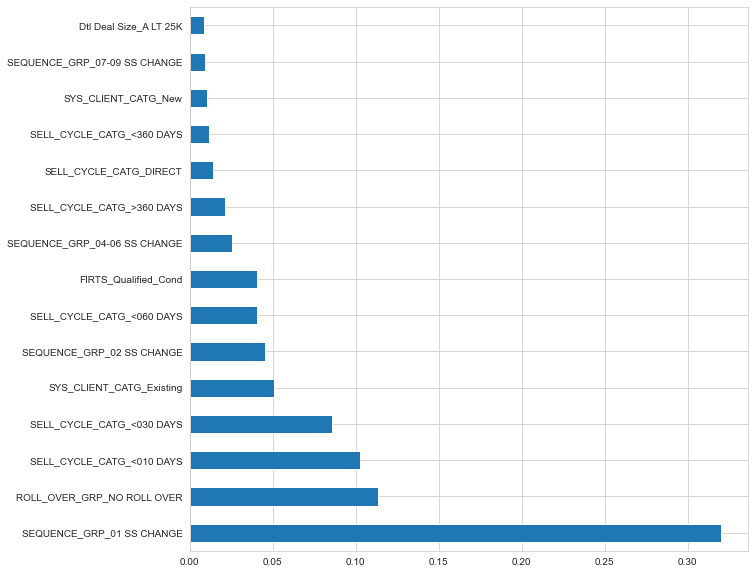

In [91]:
# Get Feature Importance from the classifier
feature_importance = gbc.feature_importances_
print (feature_importance)
feat_importances = pd.Series(gbc.feature_importances_, index=X1.columns)
feat_importances = feat_importances.nlargest(15)
feat_importances.plot(kind='barh' , figsize=(10,10))

In [23]:
import sklearn.model_selection as model_selection
X_train,X_test,y_train,y_test=model_selection.train_test_split(X,y,test_size=0.2,random_state=200)

In [24]:
import os
import sklearn.tree as tree
clf=tree.DecisionTreeClassifier(max_depth=3,random_state=200)
clf.fit(X_train,y_train)
clf.score(X_test,y_test)

0.8887323943661972

In [25]:
import sklearn.metrics as metrics
metrics.roc_auc_score(y_test,clf.predict_proba(X_test)[:,1])

0.0716827297725787

In [46]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
#import pydotplus
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
#os.chdir(data_dir)

In [47]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                         feature_names=X1.columns,  
                         class_names=["0","1"],  
                         filled=True, rounded=True,  
                         special_characters=True,proportion=True)

IndexError: list index out of range

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data)

In [ ]:
from IPython.display import Image

In [ ]:
Image(graph.create_png())